## This notebook is to evaluate the data generated by the model and how well it represents the original dataset

In [1]:
import pandas as pd
from scipy.stats import ks_2samp, mannwhitneyu, chi2_contingency
from datetime import datetime

In [2]:
# Load your datasets
original_data = pd.read_csv('final_df_original.csv')
print(original_data.shape)
original_data.head()

(24250, 15)


,patient_id,gender_code,birth_date,cpt_code,primary_diagnosis_code,visit_start_date,visit_end_date,billed_amount,paid_amount,ndc,drug_name,fill_date,paid_date,billed_amount_pharm,paid_amount_pharm
0,p_0,F,1980-03-14,99213,J111,2018-02-16,2018-02-16,121.0,71.92,4.778105e+10,OSELTAMIVIR,2018-02-16,2018-02-16,156.57,0.00
1,p_1,F,1975-06-10,99396,Z0000,2018-05-04,2018-05-04,340.0,142.42,5.441842e+07,DEXAMETHASON,2018-09-12,2018-09-12,0.00,0.00
2,p_2,F,1992-08-19,87880,B349,2018-02-14,2018-02-14,70.8,0.00,6.586200e+10,AMOXICILLIN,2018-02-18,2018-02-18,14.68,0.00
3,p_3,M,1961-12-04,99000,I10,2018-11-15,2018-11-15,17.0,0.00,6.818005e+10,LISINOPRIL,2018-11-16,2018-11-16,140.74,0.00
4,p_4,F,1959-10-27,99203,S43402A,2018-03-31,2018-03-31,293.0,0.00,6.516202e+10,NAPROXEN,2018-03-31,2018-03-31,19.40,1.95


In [3]:
date_cols = ['fill_date', 'paid_date', 'visit_start_date', 'visit_end_date', 'birth_date']
for col in date_cols:
    original_data[col] = pd.to_datetime(original_data[col])
current_date = datetime.now()
original_data['age'] = (current_date - original_data['birth_date']).astype('<m8[Y]')

In [4]:
original_data.shape

(24250, 16)

In [5]:
synthetic_data = pd.read_csv('gpt2_model_baseline_synthetic_data_time.csv')
print(synthetic_data.shape)
synthetic_data.head()

(10000, 15)


,patient_id,gender_code,birth_date,cpt_code,primary_diagnosis_code,visit_start_date,visit_end_date,billed_amount,paid_amount,ndc,drug_name,fill_date,paid_date,billed_amount_pharm,paid_amount_pharm
0,p_3372,F,1964-08-14,99284,Z0000,2018-06-01,2018-06-01,150.0,0.0,9.341617e+07,PROMETAN,2018-05-29,2018-06-01,-73.98,0.00
1,p_2988,F,1990-08-06,88142,L2084,2018-05-16,2018-05-16,10.0,0.0,9.308110e+06,AMOX,2018-05-16,2018-05-16,0.00,0.00
2,p_1589,F,1973-05-07,82278,R109,2018-11-13,2018-11-13,35.0,0.0,7.815022e+08,AFLURIA,2018-11-13,2018-11-13,0.00,0.00
3,p_1337,M,2002-06-17,99214,H6089,2018-05-11,2018-05-11,100.0,0.0,6.586206e+10,CLONAZEPAM,2018-05-11,2018-05-11,-17.00,-4.54
4,p_1048,F,1956-05-08,99213,S8391XD,2018-11-13,2018-11-13,110.0,0.0,5.167213e+10,METOPROL,2018-11-13,2018-11-13,0.00,0.00


In [6]:
synthetic_data.columns

Index(['patient_id', 'gender_code', 'birth_date', 'cpt_code',
       'primary_diagnosis_code', 'visit_start_date', 'visit_end_date',
       'billed_amount', 'paid_amount', 'ndc', 'drug_name', 'fill_date',
       'paid_date', 'billed_amount_pharm', 'paid_amount_pharm'],
      dtype='object')

In [7]:
for col in date_cols:
    synthetic_data[col] = pd.to_datetime(synthetic_data[col], errors='coerce')
synthetic_data['age'] = (current_date - synthetic_data['birth_date']).astype('<m8[Y]')

In [8]:
numerical_columns=['billed_amount', 'paid_amount', 'billed_amount_pharm', 'paid_amount_pharm', 'age']
categorical_columns=['gender_code', 'cpt_code',
                     'primary_diagnosis_code', 'visit_start_date', 'visit_end_date',
                     'fill_date','paid_date',
                     'ndc', 'drug_name']

In [9]:
# Significance level
alpha=0.05

In [10]:
# Validate numerical columns using Kolmogorov-Smirnov test
matched_cols = []
unmatched_cols = []
for col in numerical_columns:
    statistic, pvalue = ks_2samp(original_data[col], synthetic_data[col])
    print(f'Column: {col}, K-S statistic: {statistic}, p-value: {pvalue}\n')
    if pvalue < alpha:
        unmatched_cols.append(col)
        print(f"The distributions are statistically different (reject null hypothesis) according to Kolmogorov-Smirnov test for {col} Column.")
    else:
        matched_cols.append(col)
        print(f"The distributions are not statistically different (fail to reject null hypothesis) according to Kolmogorov-Smirnov test for {col} Column.")

Column: billed_amount, K-S statistic: 0.18005979381443293, p-value: 2.5886741217589043e-201

The distributions are statistically different (reject null hypothesis) according to Kolmogorov-Smirnov test for billed_amount Column.
Column: paid_amount, K-S statistic: 0.38448969072164946, p-value: 0.0

The distributions are statistically different (reject null hypothesis) according to Kolmogorov-Smirnov test for paid_amount Column.
Column: billed_amount_pharm, K-S statistic: 0.31022371134020615, p-value: 0.0

The distributions are statistically different (reject null hypothesis) according to Kolmogorov-Smirnov test for billed_amount_pharm Column.
Column: paid_amount_pharm, K-S statistic: 0.004831958762886598, p-value: 0.9962191657084493

The distributions are not statistically different (fail to reject null hypothesis) according to Kolmogorov-Smirnov test for paid_amount_pharm Column.
Column: age, K-S statistic: 0.07001546391752578, p-value: 1.2657434610184837e-30

The distributions are stat

In [11]:
print(f"Columns that are similar to original: {matched_cols}")
print(f"Columns that are different from original: {unmatched_cols}")

Columns that are similar to original: ['paid_amount_pharm']
Columns that are different from original: ['billed_amount', 'paid_amount', 'billed_amount_pharm', 'age']


In [12]:
matched_cols = []
unmatched_cols = []
# Mann-Whitney Test
for col in numerical_columns:
    u_statistic, u_p_value = mannwhitneyu(original_data[col], synthetic_data[col], alternative='two-sided')
    if u_p_value < alpha:
        unmatched_cols.append(col)
        print(f"\nThe distributions are statistically different (reject null hypothesis) according to Mann-Whitney U test for {col} Column.")
    else:
        matched_cols.append(col)
        print("\nThe distributions are not statistically different (fail to reject null hypothesis) according to Mann-Whitney U test for {col} Column.")
    print(f'Column: {col}, Mann Whitney statistic: {statistic}, p-value: {pvalue}\n')


The distributions are not statistically different (fail to reject null hypothesis) according to Mann-Whitney U test for {col} Column.
Column: billed_amount, Mann Whitney statistic: 0.07001546391752578, p-value: 1.2657434610184837e-30


The distributions are not statistically different (fail to reject null hypothesis) according to Mann-Whitney U test for {col} Column.
Column: paid_amount, Mann Whitney statistic: 0.07001546391752578, p-value: 1.2657434610184837e-30


The distributions are not statistically different (fail to reject null hypothesis) according to Mann-Whitney U test for {col} Column.
Column: billed_amount_pharm, Mann Whitney statistic: 0.07001546391752578, p-value: 1.2657434610184837e-30


The distributions are not statistically different (fail to reject null hypothesis) according to Mann-Whitney U test for {col} Column.
Column: paid_amount_pharm, Mann Whitney statistic: 0.07001546391752578, p-value: 1.2657434610184837e-30


The distributions are not statistically differe

In [13]:
print(f"Columns that are similar to original: {matched_cols}")
print(f"Columns that are different from original: {unmatched_cols}")

Columns that are similar to original: ['billed_amount', 'paid_amount', 'billed_amount_pharm', 'paid_amount_pharm', 'age']
Columns that are different from original: []


In [14]:
# Validate categorical columns using a chi-squared test
matched_cols = []
unmatched_cols = []
for col in categorical_columns:
    contingency_table = pd.crosstab(original_data[col], synthetic_data[col])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f'Column: {col}, Chi-square statistic: {chi2}, p-value: {p}\n')
    if p < alpha:
        matched_cols.append(col)
        print(f"There is a significant association between the {col} column in the real and generated dataset.")
    else:
        unmatched_cols.append(col)
        print(f"There is no significant association between the {col} column in the real and generated dataset.")

Column: gender_code, Chi-square statistic: 2.659281016456598, p-value: 0.2645723557908827

There is no significant association between the gender_code column in the real and generated dataset.
Column: cpt_code, Chi-square statistic: 374991.5995437515, p-value: 6.145661063312934e-35

There is a significant association between the cpt_code column in the real and generated dataset.
Column: primary_diagnosis_code, Chi-square statistic: 1948325.221590044, p-value: 1.0

There is no significant association between the primary_diagnosis_code column in the real and generated dataset.
Column: visit_start_date, Chi-square statistic: 133920.86492179096, p-value: 0.01999498561383461

There is a significant association between the visit_start_date column in the real and generated dataset.
Column: visit_end_date, Chi-square statistic: 133681.5525544449, p-value: 0.01079466859847627

There is a significant association between the visit_end_date column in the real and generated dataset.
Column: fill_da

In [15]:
print(f"Columns that are similar to original: {matched_cols}")
print(f"Columns that are different from original: {unmatched_cols}")

Columns that are similar to original: ['cpt_code', 'visit_start_date', 'visit_end_date', 'ndc']
Columns that are different from original: ['gender_code', 'primary_diagnosis_code', 'fill_date', 'paid_date', 'drug_name']


In [16]:
from sdv.metadata import SingleTableMetadata
from sdv.evaluation.single_table import get_column_plot

In [17]:
graph_cols = ['billed_amount', 'paid_amount', 'billed_amount_pharm', 'paid_amount_pharm',
              'gender_code', 'age', 'cpt_code',
              'primary_diagnosis_code', 'visit_start_date', 'visit_end_date',
              'paid_date', 'fill_date',
              'ndc', 'drug_name'
             ]

metadata = SingleTableMetadata()
metadata.detect_from_dataframe(data=original_data[graph_cols])

In [18]:
python_dict = metadata.to_dict()
python_dict

{'columns': {'billed_amount': {'sdtype': 'numerical'},
  'paid_amount': {'sdtype': 'numerical'},
  'billed_amount_pharm': {'sdtype': 'numerical'},
  'paid_amount_pharm': {'sdtype': 'numerical'},
  'gender_code': {'sdtype': 'categorical'},
  'age': {'sdtype': 'numerical'},
  'cpt_code': {'sdtype': 'categorical'},
  'primary_diagnosis_code': {'sdtype': 'categorical'},
  'visit_start_date': {'sdtype': 'datetime'},
  'visit_end_date': {'sdtype': 'datetime'},
  'paid_date': {'sdtype': 'datetime'},
  'fill_date': {'sdtype': 'datetime'},
  'ndc': {'sdtype': 'numerical'},
  'drug_name': {'sdtype': 'categorical'}},
 'METADATA_SPEC_VERSION': 'SINGLE_TABLE_V1'}

In [19]:
metadata.update_column(
    column_name='visit_start_date',
    sdtype='datetime',
    datetime_format='%Y-%m-%d')
metadata.update_column(
    column_name='visit_end_date',
    sdtype='datetime',
    datetime_format='%Y-%m-%d')
metadata.update_column(
    column_name='fill_date',
    sdtype='datetime',
    datetime_format='%Y-%m-%d')
metadata.update_column(
    column_name='paid_date',
    sdtype='datetime',
    datetime_format='%Y-%m-%d')

In [20]:
for col in graph_cols:
    fig = get_column_plot(
        real_data=original_data,
        synthetic_data=synthetic_data,
        column_name=col,
        metadata=metadata
    )
        
    fig.show()

In [21]:
from sdv.evaluation.single_table import run_diagnostic

diagnostic_report = run_diagnostic(
    real_data=original_data[graph_cols],
    synthetic_data=synthetic_data[graph_cols],
    metadata=metadata)

Generating report ...
(3/3) Evaluating Synthesis: : 100%|███████████████| 1/1 [01:28<00:00, 88.85s/it]

Diagnostic Results:

SUCCESS:
✓ The synthetic data follows over 90% of the min/max boundaries set by the real data
✓ Over 90% of the synthetic rows are not copies of the real data

! The synthetic data is missing more than 10% of the numerical ranges present in the real data

DANGER:
x The synthetic data is missing more than 50% of the categories present in the real data


In [22]:
from sdv.evaluation.single_table import evaluate_quality

quality_report = evaluate_quality(
    real_data=original_data[graph_cols],
    synthetic_data=synthetic_data[graph_cols],
    metadata=metadata)

Generating report ...
(2/2) Evaluating Column Pair Trends: : 100%|████| 91/91 [00:44<00:00,  2.05it/s]

Overall Quality Score: 77.07%

Properties:
- Column Shapes: 84.61%
- Column Pair Trends: 69.54%


In [23]:
quality_report.get_details(property_name='Column Shapes')

,Column,Metric,Score
0,billed_amount,KSComplement,0.820232
1,paid_amount,KSComplement,0.615708
2,billed_amount_pharm,KSComplement,0.690073
3,paid_amount_pharm,KSComplement,0.995223
4,gender_code,TVComplement,0.989855
5,age,KSComplement,0.930946
6,cpt_code,TVComplement,0.717106
7,primary_diagnosis_code,TVComplement,0.657533
8,visit_start_date,KSComplement,0.975232
9,visit_end_date,KSComplement,0.975110


In [24]:
def out_of_training_sample(real_data,generated_data,col):
    out_of_train_sample_codes=set(generated_data[col])-set(real_data[col])
    total_unique_codes_generated=set(synthetic_data[col])
    total_unique_codes_original=set(real_data[col])
    print(f"% of Out of Training Sample codes generated for {col} column is  {(len(out_of_train_sample_codes)/len(total_unique_codes_generated))*100:.2f} %")
    return out_of_train_sample_codes

In [25]:
out_codes = out_of_training_sample(original_data, synthetic_data, 'primary_diagnosis_code')
out_codes = out_of_training_sample(original_data, synthetic_data, 'cpt_code')
out_codes = out_of_training_sample(original_data, synthetic_data, 'drug_name')

% of Out of Training Sample codes generated for primary_diagnosis_code column is  54.31 %
% of Out of Training Sample codes generated for cpt_code column is  53.59 %
% of Out of Training Sample codes generated for drug_name column is  37.12 %


In [26]:
eval_cols = ['billed_amount', 'paid_amount', 'billed_amount_pharm', 'paid_amount_pharm',
              'gender_code', 'age', 'cpt_code',
              'primary_diagnosis_code', 'ndc', 'drug_name'
            ]

In [27]:
train_orig = original_data[eval_cols]
train_synthetic = synthetic_data[eval_cols]
train_orig["AV_label"] = 0
train_synthetic["AV_label"]  = 1

In [28]:
all_data = pd.concat([train_orig, train_synthetic], axis=0, ignore_index=True)
all_data = all_data.sample(frac=1)
for col in eval_cols:
    if col in categorical_columns:
        all_data[col] = all_data[col].astype('category')

In [29]:
X = all_data.drop(['AV_label'], axis=1)
y = all_data['AV_label']

In [30]:
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [32]:
xgb_model = XGBClassifier(n_estimators=50, enable_categorical=True, n_jobs=-2, random_state=2, )
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=True, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=-2,
              num_parallel_tree=None, random_state=2, ...)

In [33]:
pred = xgb_model.predict(X_test)
print(f"ROC AUC Score: {roc_auc_score(y_test, pred)}")

ROC AUC Score: 0.9268445368156152


In [34]:
synthetic_data2 = pd.read_csv('final_df_synthetic.csv')

for col in date_cols:
    synthetic_data2[col] = pd.to_datetime(synthetic_data2[col], errors='coerce')
current_date = datetime.now()
synthetic_data2['age'] = (current_date - synthetic_data2['birth_date']).astype('<m8[Y]')

print(synthetic_data2.shape)
synthetic_data2.head()

(5500, 16)


,patient_id,gender_code,birth_date,cpt_code,primary_diagnosis_code,visit_start_date,visit_end_date,billed_amount,paid_amount,ndc,drug_name,fill_date,paid_date,billed_amount_pharm,paid_amount_pharm,age
0,p_2535,M,1992-05-24,99213,J029,2018-06-26,2018-06-26,0.0,0.0,5.941750e+09,CLINDAMYCYCL,2018-06-26,2018-06-26,-26.42,0.0,31.0
1,p_4383,M,2010-06-27,99213,R04,2018-01-20,2018-01-20,99.0,0.0,5.186803e+10,AMPHETAMINE,2018-01-20,2018-01-20,0.00,0.0,13.0
2,p_3665,F,1968-11-22,99214,D939,2018-04-29,2018-04-29,49.0,0.0,5.400501e+07,CEFDINIR,2018-04-29,2018-04-29,0.00,0.0,55.0
3,p_2664,M,1993-08-06,99383,J111,2018-05-29,2018-05-29,120.0,0.0,1.671402e+10,IBUPROFEN,2018-06-27,2018-06-27,0.00,0.0,30.0
4,p_1717,M,1989-09-08,99214,Z0000,2018-01-25,2018-01-25,170.0,0.0,7.043206e+08,PREDNISONE,2018-01-25,2018-01-25,37.54,0.0,34.0


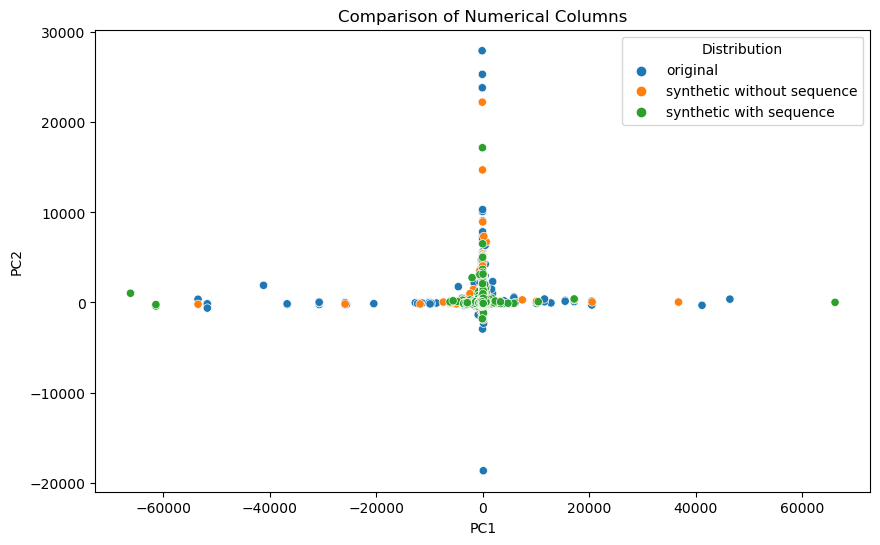

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA


train_orig = original_data[eval_cols]
train_synthetic = synthetic_data[eval_cols]
train_synthetic2 = synthetic_data2[eval_cols]
train_orig["AV_label"] = 'original'
train_synthetic["AV_label"]  = 'synthetic without sequence'
train_synthetic2["AV_label"]  = 'synthetic with sequence'

all_data = pd.concat([train_orig, train_synthetic, train_synthetic2], axis=0, ignore_index=True)
all_data = all_data.sample(frac=1)
for col in eval_cols:
    if col in categorical_columns:
        all_data[col] = all_data[col].astype('category')

y = all_data['AV_label']
        
# Apply PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(all_data[numerical_columns].fillna(0))

# Create a 'hue' list to distinguish between the two distributions
hue = ['Distribution 1']*200 + ['Distribution 2']*200

# Create a DataFrame
df = pd.DataFrame(data_pca, columns=['PC1', 'PC2'])
df['Distribution'] = y

# Plot the distributions
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='PC1', y='PC2', hue='Distribution', palette="tab10")
plt.title('Comparison of Numerical Columns')
plt.show()

In [36]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2)

train_orig = original_data[eval_cols]
train_synthetic = synthetic_data[eval_cols]
train_synthetic2 = synthetic_data2[eval_cols]
train_orig["AV_label"] = 'original'
train_synthetic["AV_label"]  = 'synthetic without sequence'
train_synthetic2["AV_label"]  = 'synthetic with sequence'

all_data_1 = pd.concat([train_orig, train_synthetic], axis=0, ignore_index=True)
all_data_1 = all_data_1.sample(frac=1)
for col in eval_cols:
    if col in categorical_columns:
        all_data_1[col] = all_data_1[col].astype('category')

y_1 = all_data_1['AV_label']

all_data_2 = pd.concat([train_orig, train_synthetic2], axis=0, ignore_index=True)
all_data_2 = all_data_2.sample(frac=1)
for col in eval_cols:
    if col in categorical_columns:
        all_data_2[col] = all_data_2[col].astype('category')

y_2 = all_data_2['AV_label']
        

tsne_data = tsne.fit_transform(all_data_1[numerical_columns].fillna(0))

tsne2 = TSNE(n_components=2)
tsne_data2 = tsne2.fit_transform(all_data_2[numerical_columns].fillna(0))

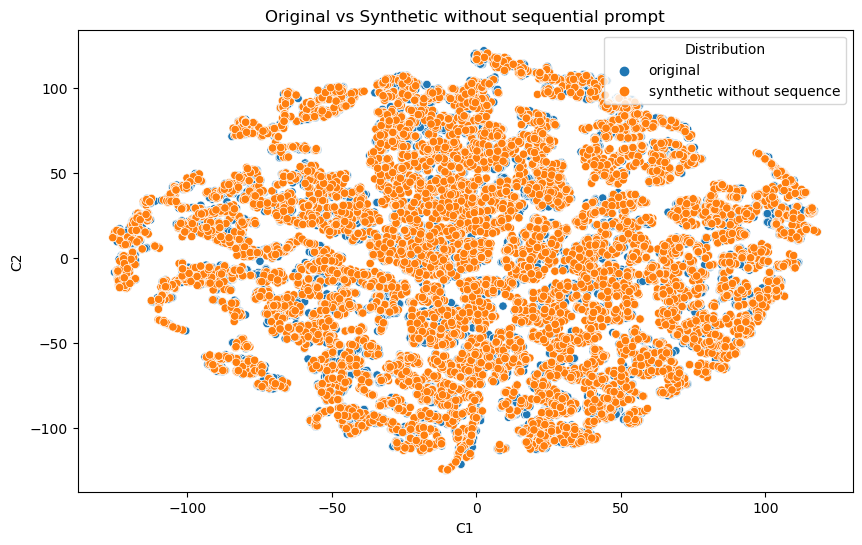

In [37]:
df = pd.DataFrame(tsne_data, columns=['C1', 'C2'])
df['Distribution'] = y

# Plot the distributions
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='C1', y='C2', hue='Distribution', palette="tab10")
plt.title('Original vs Synthetic without sequential prompt')
plt.show()

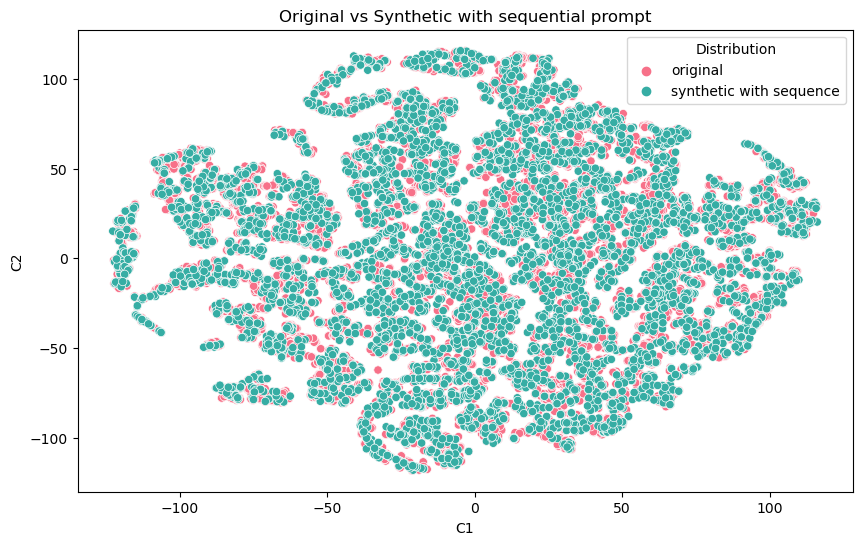

In [51]:
df = pd.DataFrame(tsne_data2, columns=['C1', 'C2'])
df['Distribution'] = y_2

# Plot the distributions
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='C1', y='C2', hue='Distribution', palette="husl")
plt.title('Original vs Synthetic with sequential prompt')
plt.show()

In [39]:
print(f"KL divergence between original and synthetic data without sequential prompt: {tsne.kl_divergence_}")

KL divergence between original and synthetic data without sequential prompt: 1.4659929275512695


In [40]:
print(f"KL divergence between original and synthetic data with sequential prompt: {tsne2.kl_divergence_}")

KL divergence between original and synthetic data with sequential prompt: 1.4288859367370605


In [41]:
def feasible_dates(dataset,column):
    dataset[col]=pd.to_datetime(dataset[col],errors='coerce')
    print(f"{(1-(dataset[col].isna().sum()/(len(dataset[col]))))*100:.2f} % of values for column {col} are within feasible bounds.")

In [42]:
column_list=['birth_date','visit_start_date','visit_end_date','fill_date','paid_date']
for col in column_list:
    feasible_dates(synthetic_data,column=col)

99.47 % of values for column birth_date are within feasible bounds.
99.67 % of values for column visit_start_date are within feasible bounds.
99.68 % of values for column visit_end_date are within feasible bounds.
99.64 % of values for column fill_date are within feasible bounds.
99.49 % of values for column paid_date are within feasible bounds.


In [43]:
final_df_synthetic = synthetic_data.copy()
(final_df_synthetic['visit_end_date']-final_df_synthetic['visit_start_date']).dt.days.value_counts()

 0.0     9965
-31.0       1
 1.0        1
dtype: int64

In [44]:
df_intermediate=final_df_synthetic[(final_df_synthetic['paid_date'].notna()) & (final_df_synthetic['fill_date'].notna())]
print(f"Infeasible value {round((((df_intermediate['paid_date']-df_intermediate['fill_date']).dt.days.astype(int)<0).sum()/len(df_intermediate['paid_date']))*100,2)} %")

Infeasible value 0.77 %


In [46]:
import numpy as np
print(f"Infeasible value {((final_df_synthetic['paid_amount']>np.abs(final_df_synthetic['billed_amount'])).sum()/len(final_df_synthetic['paid_date']))*100:.2f} %")

Infeasible value 0.54 %


In [47]:
def top_alignment(real_data,synthetic_data,base_column,agg_column, threshold=None):
    top_real = set(real_data.groupby(base_column)[agg_column].mean().sort_values(ascending=False).head(threshold).index.values)
    top_synthetic=set(synthetic_data.groupby(base_column)[agg_column].mean().sort_values(ascending=False).head(threshold).index.values)

    return len(top_real.intersection(top_synthetic))

top_alignment(original_data, synthetic_data,'drug_name','paid_amount_pharm',1000)

248